Title

In [24]:
import functions as f
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import rembg
import skimage.io
import skimage.data
import skimage.morphology as morph
from skimage.measure import label, regionprops
import csv
import math
import random

Preprocesamiento

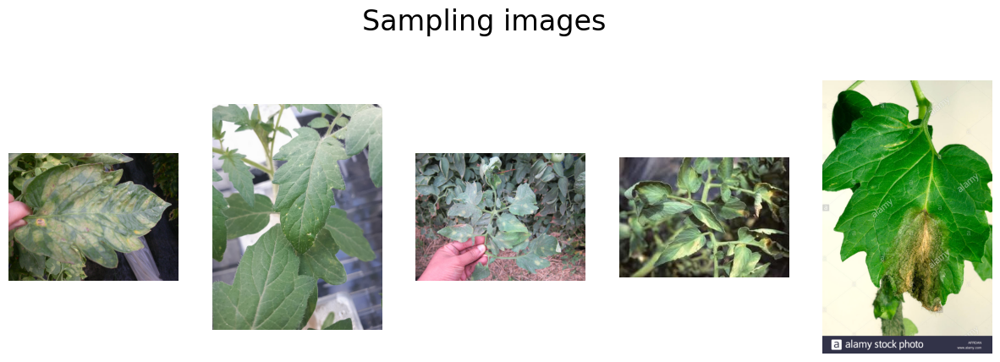

In [25]:
dataSetPath_train = 'PlantDoc-Dataset-master/train/Tomato mold leaf'
dataSetPath_test = 'PlantDoc-Dataset-master/test/Tomato mold leaf'
imagePath_list = [] #to store image paths
images = [] #to store images

imagePaths = os.listdir(dataSetPath_train) #to get the images paths

for n in range(5): #Select 5 random images from the dataset
    randomInt = imagePaths[random.randrange(0,len(imagePaths)-1,1)]
    imagePath_list.append(randomInt)
for image_path in imagePath_list:
    if image_path.endswith('.jpg'):
        imgPath = os.path.join(dataSetPath_train,image_path)
        aux = f.im_read(imgPath)
        # aux = cv2.GaussianBlur(aux,(7,7),3)
        images.append(aux)

# image_path = 'PlantDoc-Dataset-master/train/Tomato mold leaf/tomato_leaf-mold_02_zoom.jpg' #work well
# image_path = 'PlantDoc-Dataset-master/train/Tomato mold leaf/TomatoLeafMold2-50QUALITY-1b89zfs.jpg' #works ... well
# image_path = 'PlantDoc-Dataset-master/train/Tomato mold leaf/leaf_mold_nightshade2x500.jpg'
# image_path = 'PlantDoc-Dataset-master/train/Tomato mold leaf/HighTunnel_TLM5.jpg' #First test works well
# image_path = 'PlantDoc-Dataset-master/train/Tomato mold leaf/Botrytis-Tomato-Seedlings-2-copy-50QUALITY-17wck0d.jpg'
# now verify if it is an image
# colors = ['RGB', 'HSV', 'HSV_FULL', 'XYZ', 'LAB', 'YUV', 'YCRCB', 'LUV', 'HLS']

f.plot_multi(images,len(images),Title= 'Sampling images')

# plt.imshow(images[0])

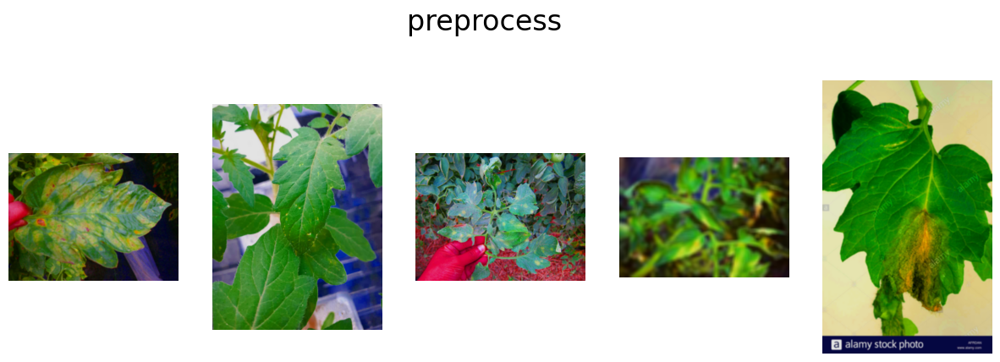

In [35]:
images1 = [f.brightness_correction(image.copy(),level='low',sat=3,val=0.9) for image in images]
#before removing background

preprocess_array = [cv2.GaussianBlur(image,(7,7),5) for image in images1]

f.plot_multi(preprocess_array,5,Title='preprocess')

In [31]:
# hsv_array = [f.convert_image_f(image,'hsv') for image in preprocess_array]
# # for image in hsv_array:
# #     f.showHistogramColor_f(image)
# rgb_array = [cv2.cvtColor(image,cv2.COLOR_HSV2RGB) for image in hsv_array]
# # f.plot_multi(rgb_array,len(rgb_array))
# # f.plot_multi(hsv_array,)
# colors = ['HSV']

# for i in colors:
#     for image in rgb_array:
#         f.showColorSpace(image, i)

Se remueve el fondo y se analiza si la imagen resultante tiene más pixeles en negro que en blanco, en este caso se considera que la imagen sin fondo está vacia y se elimina.

useful_indexes [0, 1, 2, 3, 4]
len of not_background_array 5 
len of main_images 5 



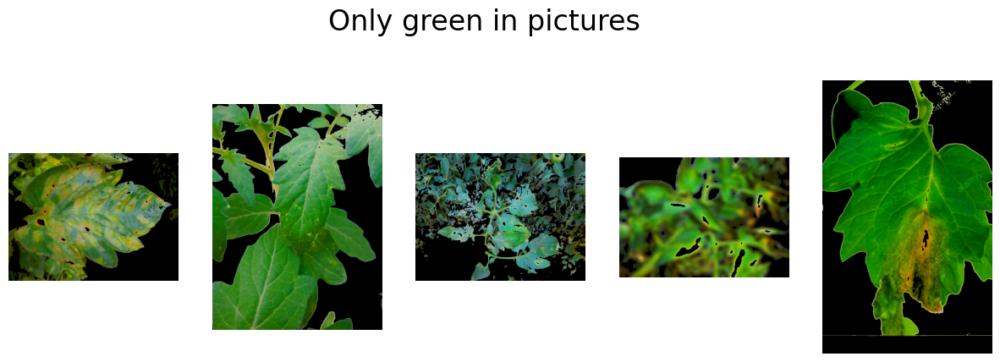

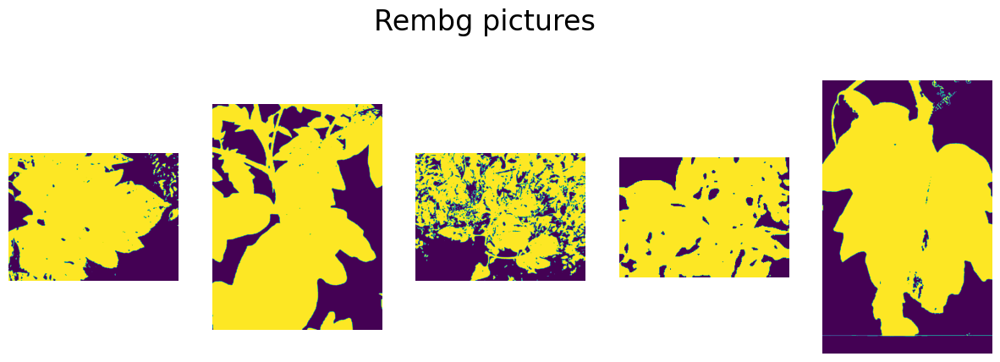

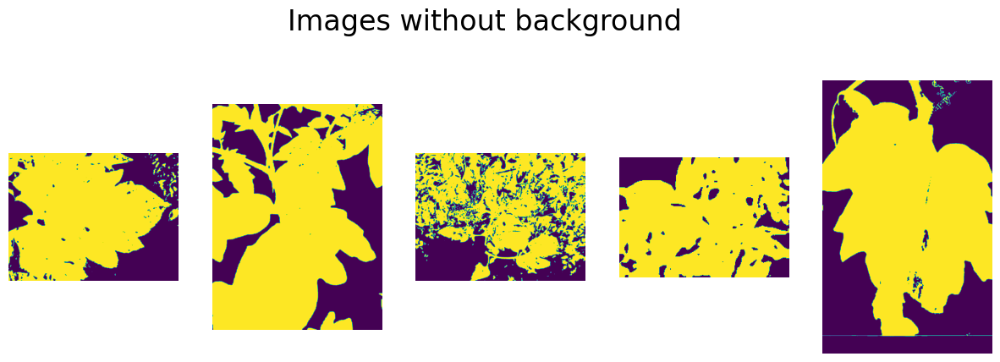

In [43]:
#removing background
# img_rembg_array = [image.copy() for image in preprocess_array]

green_mask_array = [f.convert_image_f(image.copy(),'hsv') for image in preprocess_array] 

lower_green = np.array([15, 30, 35])    # Lower bound for green (H=250, S=40, V=40)
upper_green = np.array([96, 255, 200])  # Upper bound for green (H=85, S=255, V=255)

# lower_red_yellow = np.array([15, 20, 30])    # Lower bound for green (H=250, S=40, V=40)
# upper_red_yellow = np.array([22, 254, 220])  # Upper bound for green (H=85, S=255, V=255)

# Create a mask that extracts the green color
green_mask_array = [cv2.inRange(hsv_image, lower_green, upper_green) for hsv_image in green_mask_array]

# Apply the mask to the original image to get the green parts
green_extracted = [cv2.bitwise_and(preprocess_array[i], preprocess_array[i], mask=green_mask_array[i]) for i in range(len(preprocess_array))]

if len(green_extracted)>1:
    f.plot_multi(green_extracted,len(green_extracted),Title='Only green in pictures')
else:
    f.show_image(green_extracted[0])

img_green_array = green_mask_array.copy()

img_rembg_array = [rembg.remove(image.copy()[:,:,0]) for image in preprocess_array]
img_rembg_array = [f.convert_image_f(image,'gray') for image in img_rembg_array]
img_rembg_array = [cv2.bitwise_or(img_green_array[i],img_rembg_array[i]) for i in range(len(preprocess_array))]
img_rembg_array = [cv2.threshold(image,250,255,cv2.THRESH_BINARY)[1] for image in img_rembg_array]

if len(img_rembg_array)>1:
    f.plot_multi(img_rembg_array,len(img_rembg_array),Title='Rembg pictures')
else:
    f.show_image(img_rembg_array[0])




useful_index = []

for i in range(len(img_rembg_array)): # remove not useful images
    if np.mean(img_rembg_array[i].ravel()) > 5:
        useful_index.append(i)

print('useful_indexes',useful_index)
not_background_array = []
main_images = [] #for masking later
for n in useful_index:
    not_background_array.append(img_rembg_array[n])
    main_images.append(f.convert_image_f(images[n].copy(), 'rgb'))

print('len of not_background_array',len(not_background_array),'\nlen of main_images', len(main_images),'\n')

if len(main_images)>1:
    f.plot_multi(not_background_array,len(not_background_array),Title='Images without background')
else:
    f.show_image(main_images[0])

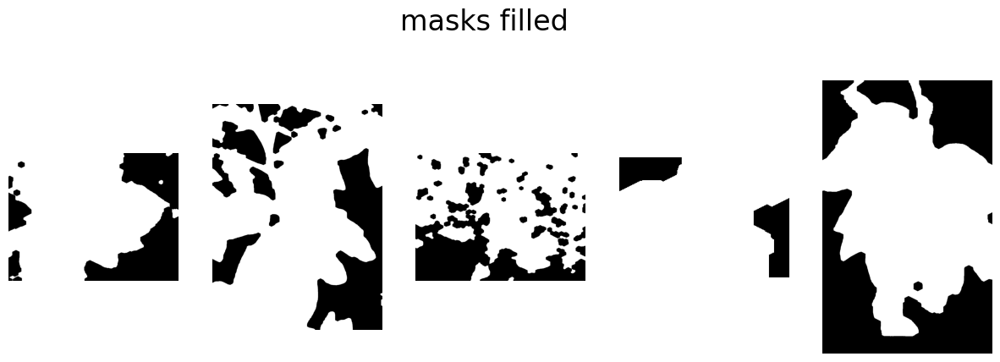

In [44]:
masks_filled = [cv2.morphologyEx(mask.copy(),cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)),iterations=5) for mask in not_background_array]
masks_filled = [cv2.morphologyEx(mask.copy(),cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)),iterations=10) for mask in masks_filled]
if len(masks_filled)>1:
    f.plot_multi(masks_filled,len(masks_filled),colorMap='gray', Title='masks filled')
else:
    f.show_image(masks_filled[0])

### Crear la máscara para extraer la parte a analizar con fondo negro antes de usar el clahe dado que no funciona con gray!!!!

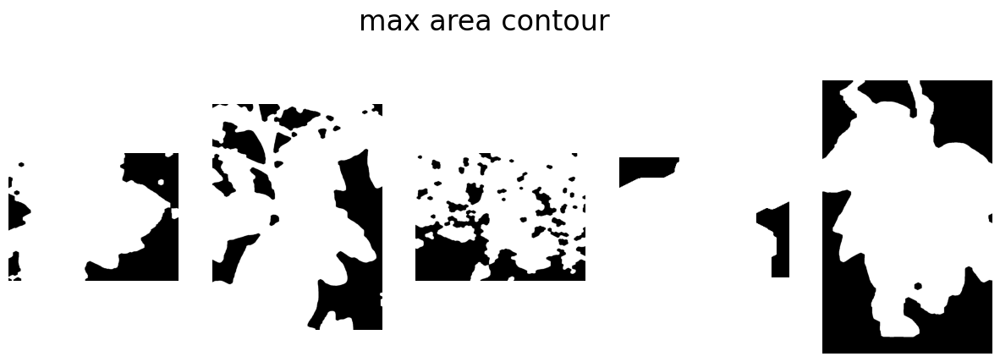

In [45]:
#Crear mascara binaria
# main_mask_array = [cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2) for image in not_background_array]
main_mask_array = [f.get_contours(image.copy(), np.zeros_like(image),fill=True) for image in masks_filled]
# f.plot_multi([element[0] for element in main_mask_array],len(main_mask_array),colorMap='gray',Title='Leaf mask')
# for element in main_mask_array:
#     max=list(element[1].values())
#     print(np.max(max))
masks = [element[0] for element in main_mask_array]
if len(masks)>1:
    f.plot_multi(masks,len(masks), colorMap='gray', Title='max area contour')
else:
    f.show_image(masks[0])

##### Dado que los contornos son demasiados vamos a buscar calibrar el area de la máscara con operaciones morfológicas

Finalmente aplicamos la máscara a la imagen original para poder analizarla

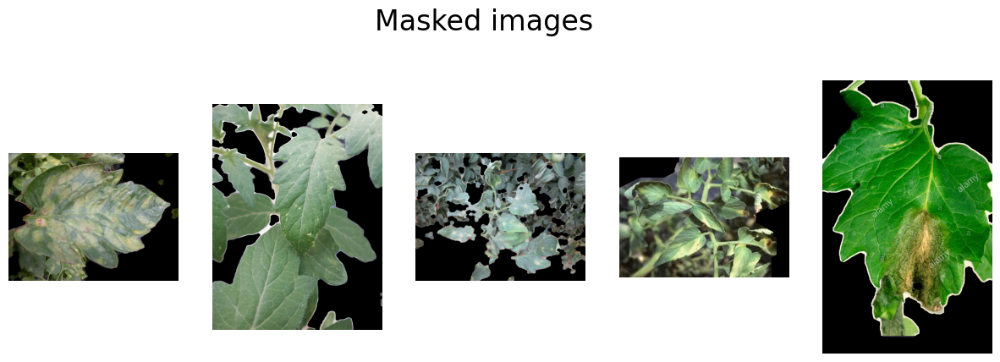

In [46]:
for i in range(len(main_images)):
    main_images[i][masks[i] == 0] = 0

# image[mask==0]=0
# main_images[2][masks_filled[2] == 0] = 0
# f.show_image(main_images[2])
if len(main_images)>1:
    f.plot_multi(main_images,len(main_images),Title='Masked images')
else:
    f.show_image(main_images[0])

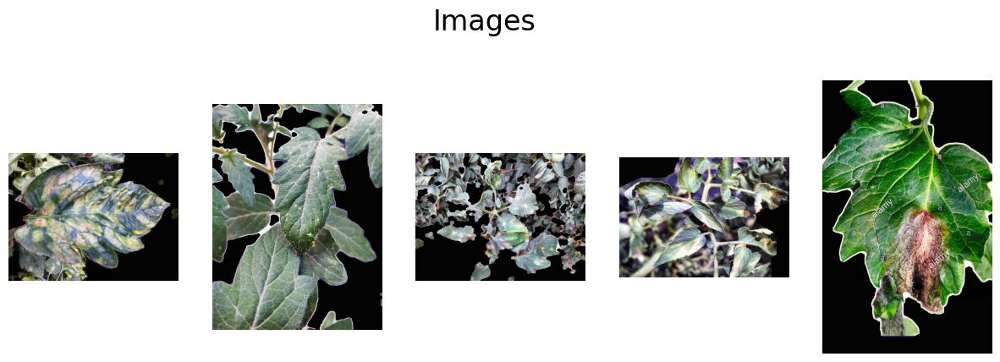

In [47]:
# for image in img_rembg_array:
#     f.showHistogramColor_f(image)

#img_eq = f.convert_image_f(img,'HSV')
#img_eq[:,:,2] = f.histogram_equalization_f(img_eq[:,:,2])
#img_eq = cv2.cvtColor(img_eq, cv2.COLOR_HSV2RGB)
# img_rembg_array = [rembg.remove(image.copy()[:,:,0]) for image in main_images]
# img_rembg_array = [f.convert_image_f(image,'gray') for image in img_rembg_array]
img_filtered_array = [f.clahe_f(image, a=2, x=5,y=5) for image in main_images]

if len(img_filtered_array)>1:
    f.plot_multi(img_filtered_array,len(img_filtered_array))
else:
    f.show_image(img_filtered_array[0])

# plt.imshow(img_eq_array[2])

# for image_eq in img_eq_array:
#     f.showHistogramColor_f(image_eq)

Selección de espacios de color

In [54]:
# sample_index = 0
# if len(img_filtered_array)>1:
#     sample_index = random.randrange(0,len(img_filtered_array)-1,1)
sample_index = 0

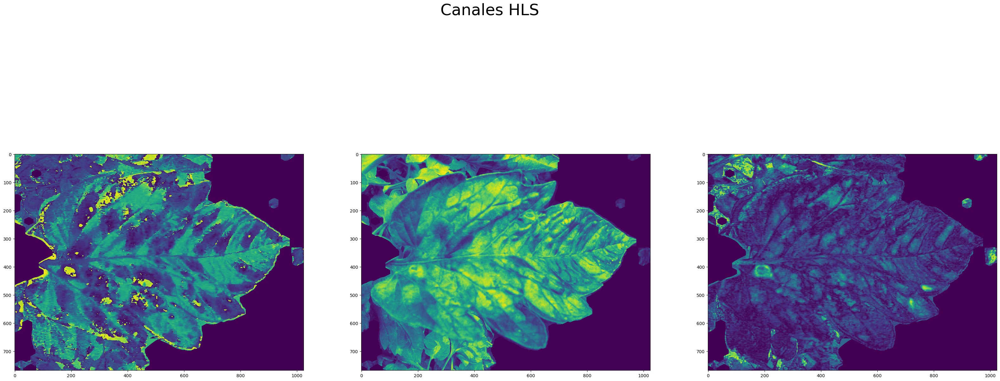

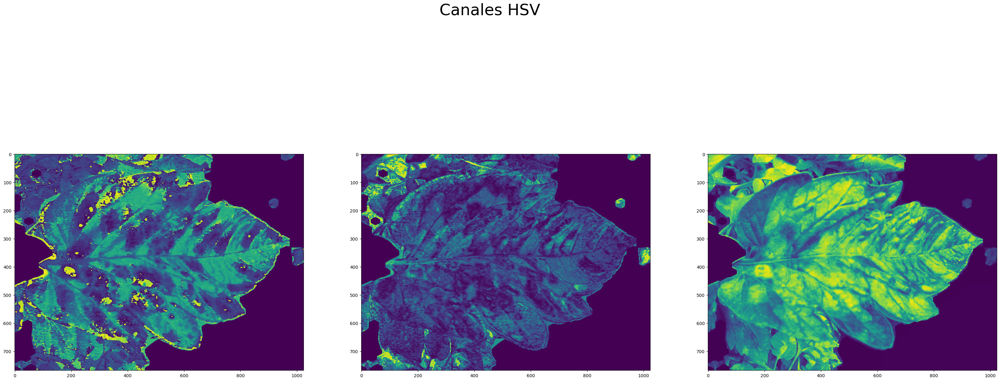

In [55]:
# colors = ['HSV','RGB', 'HSV_FULL', 'XYZ', 'LAB', 'YUV', 'YCRCB', 'LUV', 'HLS']
colors = ['HLS','HSV']

for i in colors:
    f.showColorSpace(img_filtered_array[sample_index], i)


In [56]:
def segmentation_f(img_not_bg):
    size_kernel = 5
    aux_img = None
    tomato_mold_leaf_HLS = f.convert_image_f(img_not_bg, 'HLS')#HLS or LAB
    tomato_mold_leaf_LAB = f.convert_image_f(img_not_bg, 'LAB')#HLS or LAB

    img_spots = cv2.GaussianBlur(tomato_mold_leaf_HLS,(size_kernel,size_kernel),0)[:,:,0]#Hue channel
    # f.show_image (img_not_bg)
    img_yellow = f.convert_image_f(img_not_bg, 'LAB')[:,:,0]
    
    _,mask = cv2.threshold(tomato_mold_leaf_LAB[:,:,0],20,255,cv2.THRESH_BINARY)
    
    # f.show_image(mask)
    mask = cv2.morphologyEx(mask,cv2.MORPH_DILATE,cv2.getStructuringElement(cv2.MORPH_CROSS,(size_kernel+4,size_kernel+4)),iterations=1)
    mask = cv2.morphologyEx(mask,cv2.MORPH_ERODE,cv2.getStructuringElement(cv2.MORPH_CROSS,(size_kernel+4,size_kernel+4)),iterations=5)
    
    aux_img = img_spots.copy() # red color in Hue are between -25(225) to 25 aprox
    img_spots[img_spots > 250] = 128 # to avoid some colors
    aux_img[img_spots<20] = 255 # dark areas
    aux_img[mask==0] = 0
    # f.show_image(aux_img)
    img_spots[img_spots>155] = 255 # light areas
    img_spots[mask == 0] = 0
    img_yellow[img_yellow > 200] = 255
    img_yellow[mask == 0] = 0
    
    # f.show_image(mask)
    # f.show_image(img_spots)
    # f.show_image(img_yellow)

    
    _,output_aux_spots = cv2.threshold(aux_img,240,255,cv2.THRESH_BINARY)
    # f.show_image(output_aux_spots)
    _,output_spots = cv2.threshold(img_spots,240,255,cv2.THRESH_BINARY)
    # f.show_image(output_spots)
    output_spots = cv2.bitwise_or(output_spots,output_aux_spots)

    _,output_yellow = cv2.threshold(img_yellow,250,255,cv2.THRESH_BINARY) #Yellow areas
    # f.show_image(output_spots)
    # f.show_image(output_yellow)

    output_spots = cv2.bitwise_and(output_spots,mask)
    output_yellow = cv2.bitwise_and(output_yellow,mask)

      
    output_yellow = cv2.morphologyEx(output_yellow,cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel-2,size_kernel-2)),iterations=4)
    output_yellow = cv2.morphologyEx(output_yellow,cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel,size_kernel)),iterations=2)

    output_spots = cv2.morphologyEx(output_spots,cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel-2,size_kernel-2)),iterations=1)
    output_spots = cv2.morphologyEx(output_spots,cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel,size_kernel)),iterations=5)
    # f.show_image(output_spots)
    # f.show_image(output_yellow)

    return [output_spots,output_yellow, mask]

# plt.imshow(cv2.bitwise_xor(m_spots,output_spots))

# plt.imshow(imask)
img_spots,img_yellow, mask = segmentation_f(img_filtered_array[sample_index])

# f.show_image(mask)
# f.show_image(img_spots)
# f.show_image(img_yellow)
# plt.axis('off')

# f.showHistogram_f(cv2.bitwise_xor(img_spots, mask)) 
# f.showHistogram_f(cv2.bitwise_xor(img_yellow,mask))
# f.showHistogramColor_f(img)

Here we found a yellow area and brown spots who characterize the illness

Now we can count spots and calculate the yellow area to evaluate the illness progression

Number of spots in the leaf:  49
Yellow percentage: 23.22%


Text(0.5, 1.0, 'Mold yellow area')

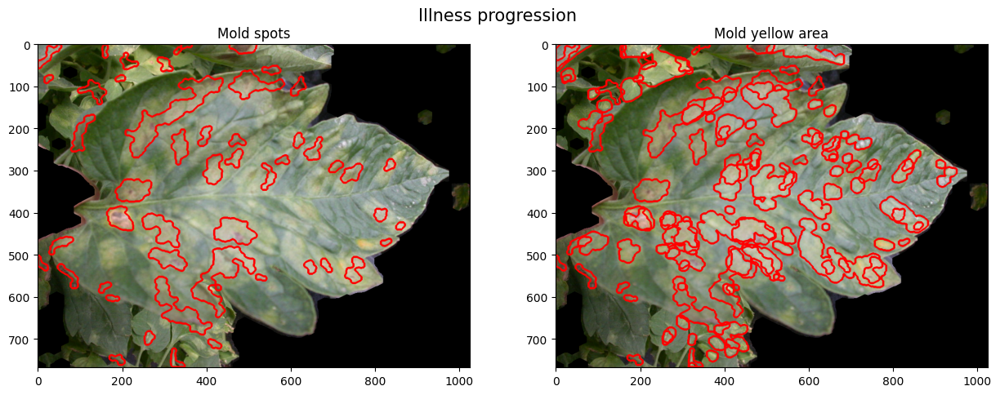

In [58]:
# to count spots and calculate yellow area
m_spots,spots, contours_spot = f.get_contours(img_spots,main_images[sample_index])
m_yellow,yellows, contours_yellow = f.get_contours(img_yellow, main_images[sample_index])
m_mask,mask_area, contours_mask = f.get_contours(mask,np.zeros_like(mask),fill=True)
# f.show_image(m_mask)

#to calculate yellow area
leaf_area = 0.0
for i in range(len(mask_area)):
    leaf_area += mask_area[i]

sum_yellows = 0.0
for i in range(len(yellows)):
    sum_yellows += yellows[i]
# print('Yellow area:',sum)

#to count sports
# print('spots_dic',spots)
# print('contours_spot', contours_spot[1])
aux_spots = [(spots[spot]/leaf_area)*100 for spot in spots] # spot_area/leaf_area in percentage
# print('aux_spots',aux_spots)
# print('max spot', np.max(aux_spots))
spots_to_draw = []
for i in range(len(spots)):
    if aux_spots[i] > 0.05:
        spots_to_draw.append(contours_spot[i])

# print('spots_to_draw',spots_to_draw)


# sum_spots_areas = 0.0
# for i in range(len(yellows)):
#     sum_yellows += yellows[i]
# # print('Yellow area:',sum)

m_spots = cv2.drawContours(main_images[sample_index],spots_to_draw,-1,(255,0,0),3)

#add if area of the spots are lower than some % of leaf area, dont count as spot

number_of_spots = len(spots_to_draw)



print('Number of spots in the leaf: ', number_of_spots)
print('Yellow percentage: %2.2f%%' %((sum_yellows/leaf_area)*100))

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15, 6))
fig.suptitle(f"Illness progression", fontsize=15, y=0.9)
ax1.imshow(m_spots)
ax2.imshow(m_yellow)

ax1.set_title('Mold spots')
ax2.set_title('Mold yellow area')

# data.append([image_path,number_of_spots+1,((sum/leaf_area)*100)])

#### Ahora podemos aislar las zonas de interés para hacer una extración de caracteristicas

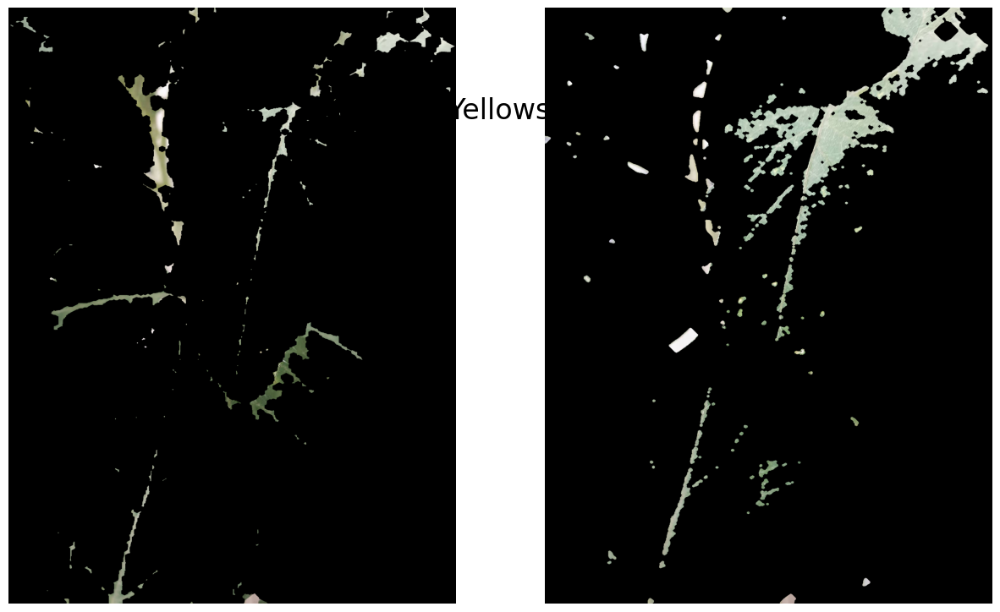

In [52]:
# m_spots,spots, contours_spot = f.get_contours(img_spots,main_images[sample_index])
# m_yellow,yellows, contours_yellow = f.get_contours(img_yellow, main_images[sample_index])

leaf_spots = images[sample_index].copy()
leaf_yellows = images[sample_index].copy()

leaf_spots[img_spots == 0] = 0
leaf_yellows[img_yellow == 0] = 0

f.plot_multi([leaf_spots,leaf_yellows],2,Title='Spots and Yellows isolated')
